<a href="https://colab.research.google.com/github/KaramAlmaghout/SurgicalToolsSegmentation/blob/main/AML_Assignment2_FasterRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Applied Machine Learning - Assignment 1

### Train Mask RCNN (an extension of Faster RCNN) on a custom data using Detectron 2


**Karam Almaghout:**

k.almaghout@innopolis.university

# Install detectron2

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=1244b5d17edb963703352cfb1039ae9e4307bf6a4fcdd9b07437fddad24b35d0
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Cloning into 'detectron2'...
remote: Enumerating objects: 14867, done.
remote: Cou

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset



## Prepare the dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Xbp6CtDn4FZ1jGn5BIlr")
project = rf.workspace("amlcourse").project("manipulators-detection")
dataset = project.version(4).download("coco")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 701.2/701.2 KB 43.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=9d2cd02ec2764c06a5761ceb2984a5ecb60734ad44d76d355e065e39544da8a2
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 5.1
    Uninstalling PyYAML-5.1:
      Successfully uninstalled PyYAML-5.1
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
  

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Manipulators-Detection-4 in coco:: 100%|██████████| 248/248 [00:00<00:00, 1587.15it/s]


Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/Manipulators-Detection-4/train/_annotations.coco.json", "/content/Manipulators-Detection-4/train")
register_coco_instances("my_dataset_val", {}, "/content/Manipulators-Detection-4/valid/_annotations.coco.json", "/content/Manipulators-Detection-4/valid")


To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



NameError: ignored

## Train!


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 2  
cfg.SOLVER.BASE_LR = 0.0005
cfg.SOLVER.MAX_ITER = 4000   
cfg.SOLVER.STEPS = []        
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/06 19:33:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/06 19:33:52 d2.engine.train_loop]: Starting training from iteration 0
[03/06 19:34:00 d2.utils.events]:  eta: 0:23:05  iter: 19  total_loss: 2.747  loss_cls: 1.503  loss_box_reg: 0.4834  loss_mask: 0.6934  loss_rpn_cls: 0.01886  loss_rpn_loc: 0.01314  time: 0.3498  last_time: 0.3486  data_time: 0.0332  last_data_time: 0.0075   lr: 9.9905e-06  max_mem: 2372M
[03/06 19:34:06 d2.utils.events]:  eta: 0:22:00  iter: 39  total_loss: 2.575  loss_cls: 1.295  loss_box_reg: 0.5539  loss_mask: 0.6886  loss_rpn_cls: 0.01516  loss_rpn_loc: 0.0113  time: 0.3381  last_time: 0.3134  data_time: 0.0112  last_data_time: 0.0065   lr: 1.998e-05  max_mem: 2372M
[03/06 19:34:13 d2.utils.events]:  eta: 0:21:32  iter: 59  total_loss: 2.289  loss_cls: 0.92  loss_box_reg: 0.6163  loss_mask: 0.6791  loss_rpn_cls: 0.01968  loss_rpn_loc: 0.01439  time: 0.3359  last_time: 0.3645  data_time: 0.0109  last_data_time: 0.0230   lr: 2.997e-05  max_mem: 2372M
[03/06 19:34:20 d2.utils.events]:  eta: 0:21:52  iter: 79  t

In [ ]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 2637), started 1:24:03 ago. (Use '!kill 2637' to kill it.)

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/06 19:58:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

/content/Manipulators-Detection-4/valid/1677925013733_jpg.rf.3e7e453bf417b129e0e6d1d7b4397967.jpg


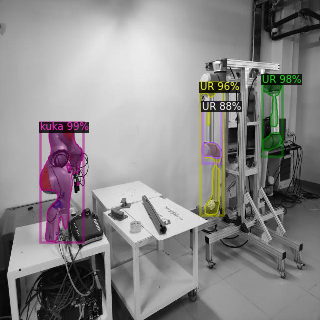

/content/Manipulators-Detection-4/valid/17587-15940099_jpg.rf.a55644bea3137538bf10ff1b132df7aa.jpg


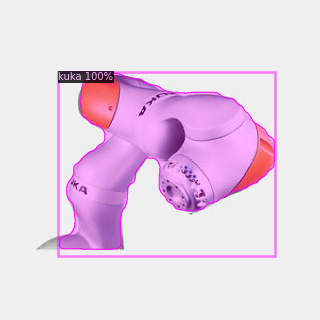

/content/Manipulators-Detection-4/valid/9e69c912fb4bca5972fe7a06fb5f102a_jpeg.rf.d1734427ca04d57eb5940905ca034e4d.jpg


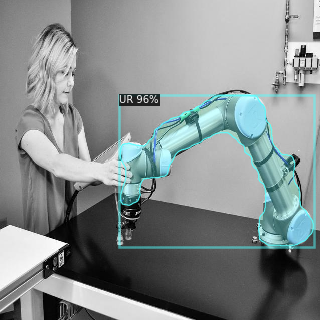

/content/Manipulators-Detection-4/valid/1677925013704_jpg.rf.52729488b06311873b976f03268b7065.jpg


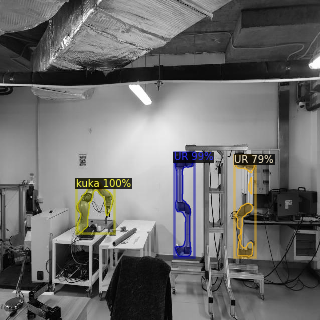

/content/Manipulators-Detection-4/valid/1677922939800_jpg.rf.54ec29e93019ac2447aae76788d28dd4.jpg


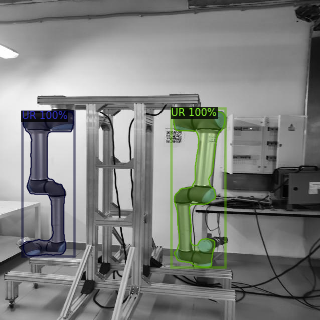

/content/Manipulators-Detection-4/valid/1677922939842_jpg.rf.8bca35dd7d39530fbdb90f1c20b0bfd4.jpg


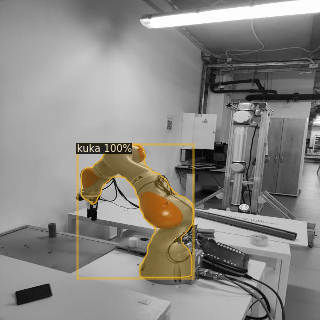

/content/Manipulators-Detection-4/valid/UR10-polishing_jpg.rf.fe7643be7333df958208c76d5ae094b1.jpg


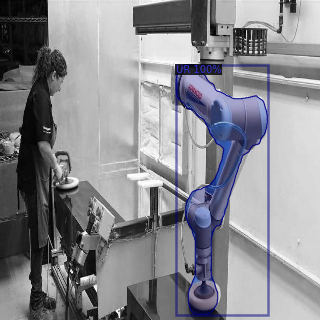

/content/Manipulators-Detection-4/valid/counter-productive-robotics_jpg.rf.1a50a3c292c9eb1c154eaccb6747f5df.jpg


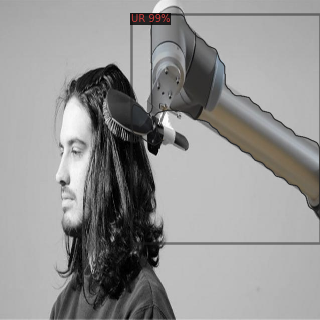

/content/Manipulators-Detection-4/valid/autonomous-transportation-with-mobile-robot-kmr-iiwa-003_jpg.rf.f21967090a16015fba57057800c5ac8f.jpg


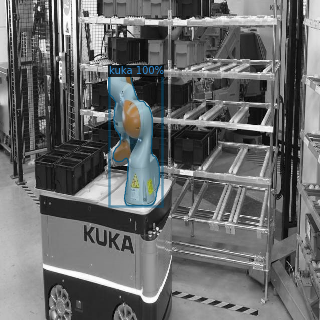

/content/Manipulators-Detection-4/valid/1677922939740_jpg.rf.464ba6dfdf6d5f9ac42197ed5dd92864.jpg


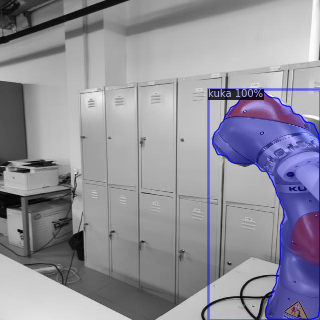

/content/Manipulators-Detection-4/valid/1677925013814_jpg.rf.32e1af14a4f06b1a46da201fda97a492.jpg


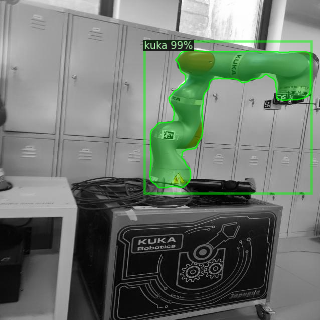

/content/Manipulators-Detection-4/valid/Hb0b1d2f56ed449a9afa67575f2f291e9f_jpg.rf.f7262b09f887d8e8b83c287f491af8c5.jpg


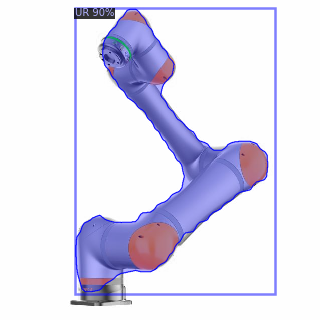

/content/Manipulators-Detection-4/valid/1677925013799_jpg.rf.255e092eb822e3f941de605a439c2d50.jpg


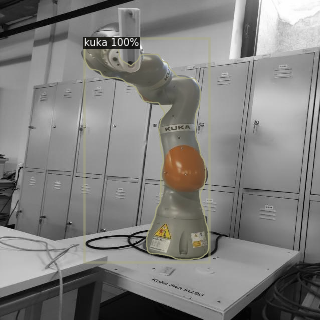

/content/Manipulators-Detection-4/valid/1677925013724_jpg.rf.294b8ec06e72e041fbbd94e9eb022cf5.jpg


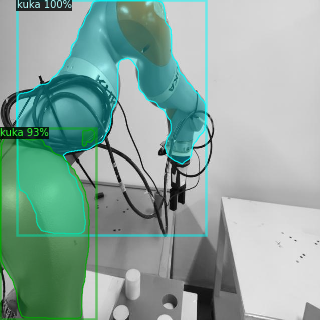

/content/Manipulators-Detection-4/valid/1677922939867_jpg.rf.175f4af04a23221c348fec3a3b251f67.jpg


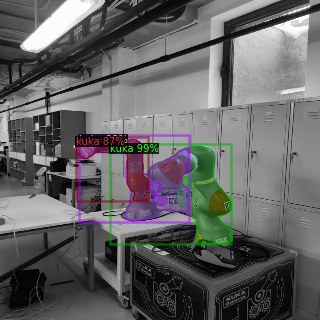

/content/Manipulators-Detection-4/valid/1677925013807_jpg.rf.2065c2e5a848076ece9d338d345a9bb8.jpg


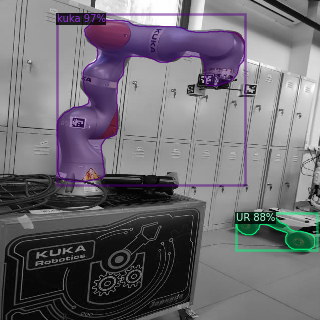

/content/Manipulators-Detection-4/valid/1677922939862_jpg.rf.39bfdcdacbf64b0b37643f88a2ff7b52.jpg


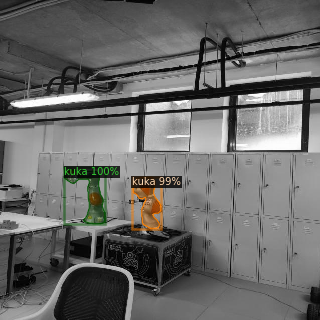

/content/Manipulators-Detection-4/valid/1677922939881_jpg.rf.032ad4bc8631f3cc9565e1dd624fe370.jpg


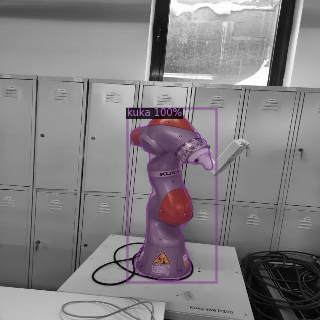

/content/Manipulators-Detection-4/valid/1677922939702_jpg.rf.52277849e48679f5424e44b00b87a2ae.jpg


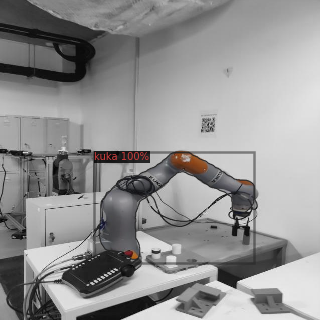

/content/Manipulators-Detection-4/valid/1677922939818_jpg.rf.bf75b521df49e20f8844b15c109edf08.jpg


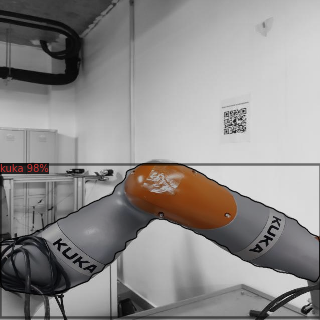

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob
mydata_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = "/content/Manipulators-Detection-4/valid/*.jpg"
for d in glob.glob(dataset_dicts):  
    print(d)
    im = cv2.imread(d)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=mydata_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[03/06 19:59:14 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/06 19:59:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/06 19:59:14 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/Manipulators-Detection-4/valid/_annotations.coco.json
[03/06 19:59:14 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/06 19:59:14 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/06 19:59:14 d2.data.common]: Serializing 20 elements to byte tensors and concatenating them all ...
[03/06 19:59:14 d2.data.common]: Serialized dataset takes 0.05 MiB
[03/06 19:59:14 d2.evaluation.evaluator]: Start inference on 20 batches
[03/06 19:59:16 d2.evaluation.evaluator]: Inference done 11/20. Datal